<a href="https://colab.research.google.com/github/NicoleBahamonMartinez/CienciaDatos_Taller1/blob/main/Taller1_AppliedDataScience.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Taller 1

MINE-4101: Ciencia de Datos Aplicada 

Universidad de los Andes  
  
Dataset: Spotify
  
Fecha de entrega: 11 de Septiembre, 2022

Desarrollador: Nicole Bahamón Martínez

# Instalación e Importación Librerias

In [2]:
!pip install --upgrade pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 268 kB 5.2 MB/s 
     |████████████████████████████████| 102 kB 46.5 MB/s 
     |████████████████████████████████| 690 kB 53.8 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |████████████████████████████████| 9.8 MB 34.3 MB/s 
     |████████████████████████████████| 4.7 MB 51.1 MB/s 
     |████████████████████████████████| 296 kB 59.7 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=038a39d3d93d64af96dc8412c91f8220701944180b3869e55c4fabbbf231dfb9
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
Successfully built htmlmin
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
  Attempting uninstall: requests
   

In [3]:
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
# Importing libraries

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport

%matplotlib inline

In [5]:
# Pandas configuration for extending the number of rows and columns to visualize, if not limit set parameter to None or -1
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

# Punto 1
Describa el conjunto de datos, tipos de variables y destaque cualquier problema de calidad
de datos y procesos de limpieza que deba implementar.

In [173]:
# Loading the CSV file as dataframe
spotify_df = pd.read_csv('/content/Data_Taller_1_Version1.csv')

ParserError: ignored

Al intentar leer los datos originales se encuentra un error en la fila 1977. Al revisar el archivo de manera manual se puede ver que esto se debe a que el artista tiene su nombre separado por una coma lo que hace que el archivo sea separado incorrectamente por comas. Por tal razón se elimina la coma del nombre del artista Tyler, The Creator y se guarda una nueva versión del archivo.


In [184]:
# Loading the CSV file as dataframe
spotify_df = pd.read_csv('/content/Data_Taller_1_Version2.csv')

In [185]:
# Showing dataframe dimensions
spotify_df.shape

(2000, 18)

In [186]:
# Showing column types
spotify_df.dtypes

artist               object
song                 object
duration_ms         float64
explicit             object
year                float64
popularity          float64
danceability        float64
energy              float64
key                 float64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
genre;               object
dtype: object

In [187]:
# Showing first rows
spotify_df.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre;
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000.0,77.0,0.751,0.834,1.0,-5.444,0.0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop;
1,"blink-182,All The Small Things,167066,False,19...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Faith Hill,Breathe,250546,False,1999,66,0.529,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Bon Jovi,It's My Life,224493,False,2000,78,0.5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,*NSYNC,Bye Bye Bye,200560.0,False,2000.0,NaN,0.614,0.928,8.0,-4.806,0.0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop;


Con la nueva versión del archivo aunque pandas puede leer el archivo se encuentra al ver las primeras 5 filas que muchos registros no son leidos correctamente y las columnas se llenan como NaNs por tal razón se decide hacer la separación manual de las columnas, guardar el nuevo archivo como .xlsx y leerlo con la herramienta de Pandas que permite hacer esto.

In [188]:
# Loading the CSV file as dataframe
spotify_df = pd.read_excel('/content/Data_Taller_1_Version3.xlsx')

In [189]:
# Showing dataframe dimensions
spotify_df.shape

(2000, 18)

In [190]:
# Showing column types
spotify_df.dtypes

artist               object
song                 object
duration_ms         float64
explicit            float64
year                float64
popularity          float64
danceability        float64
energy              float64
key                 float64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
genre                object
dtype: object

In [191]:
# Showing first rows
spotify_df.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,0.0,2000.0,77.0,0.751,0.834,1.0,-5444.0,0.0,0.0437,0.3000,0.000018,0.3550,0.894,95053.0,pop
1,blink-182,All The Small Things,167066.0,0.0,1999.0,79.0,0.434,0.897,0.0,-4918.0,1.0,0.0488,0.0103,0.000000,0.6120,0.684,148726.0,"rock, pop"
2,Faith Hill,Breathe,250546.0,0.0,1999.0,66.0,0.529,0.496,7.0,-9007.0,1.0,0.0290,0.1730,0.000000,0.2510,0.278,136859.0,"pop, country"
3,Bon Jovi,It's My Life,224493.0,0.0,2000.0,78.0,0.551,0.913,0.0,-4063.0,0.0,0.0466,0.0263,0.000013,0.3470,0.544,119992.0,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560.0,0.0,2000.0,NaN,0.614,0.928,8.0,-4806.0,0.0,0.0516,0.0408,0.001040,0.0845,0.879,172656.0,pop


## Variables 
| **Campo**        | **Descripción**                                              | **Tipo**              |
|------------------|--------------------------------------------------------------|-----------------------|
| artist           | Artista de la canción                                        | Categórica Nominal    |
| song             | Nombre de la canción                                         | Categórica Nominal    |
| duration_ms      | Duración de la canción en milisegundos                       | Cuantitativa Continua |
| explicit         | Indica si la canción tiene Contenido explícito               | Categórica Nominal    |
| year             | Año de estreno de una canción                                | Cuantitativa Discreta |
| popularity       | Entre más grande el valor más popular es la canción          | Cuantitativa Discreta |
| danceability     | Variación entre 0 y 1. 1 indica que es muy bailable          | Cuantitativa Continua |
| energy           | Medida perceptual de intensidad y actividad                  | Cuantitativa Continua |
| key              | La llave en la cual está la canción                          | Cuantitativa Discreta |
| loudness         | Intensidad del sonido de la cancion en decibeles             | Cuantitativa Continua |
| mode             | Modalidad menor o mayor de la canción                        | Categórica Nominal    |
| speechiness      | Detecta la presencia de palabras habladas en la canción      | Cuantitativa Continua |
| acousticness     | Medida de confianza de que la canción sea acústica de 0 a 1  | Cuantitativa Continua |
| instrumentalness | Predice si la canción no es vocal                            | Cuantitativa Continua |
| liveness         | Detecta la presencia de una audiencia en la grabación        | Cuantitativa Continua |
| valence          | Varia de 0 a 1 e indica la positividad musical de la canción | Cuantitativa Continua |
| tempo            | Tempo estimado de la canción en beats por minuto(BPM)        | Cuantitativa Continua |
| genre            | Género de la canción                                         | Categórica Nominal    |

## Perfilamiento de Datos

In [182]:
profile = ProfileReport(spotify_df)

In [183]:
profile.to_file('report.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Punto 2
¿Cuál es el top 10 de artistas más activos de los últimos 10 años?


In [192]:
# Seleccionamos solo los últimos 10 años del dataset
spotify_punto1_df = spotify_df[spotify_df['year']>=2012]

In [193]:
# Agrupamos el dataframe por artista
spotify_punto1_df = spotify_punto1_df.groupby('artist')

In [194]:
# Contamos la cantidad de canciones por artista
spotify_punto1_df = spotify_punto1_df['artist'].count()

In [195]:
# Organizamos el dataframe dejando los artistas con mayor cantidad de canciones en el top
spotify_punto1_df = spotify_punto1_df.sort_values(ascending = False)

In [196]:
# Tomamos los primeros 10 valores
spotify_punto1_df = spotify_punto1_df[:10].copy()

In [197]:
spotify_punto1_df

artist
Calvin Harris    18
Drake            16
Ariana Grande    14
Taylor Swift     13
David Guetta     13
Katy Perry       11
Ed Sheeran        9
One Direction     9
Post Malone       9
Maroon 5          9
Name: artist, dtype: int64

Los 10 artistas más activos son los mostrados en la lista anterior. Siendo el más activo Calvin Harris con 18 canciones. Se toma que los artistas más activos son aquellos que más canciones han sacado.

Text(0, 0.5, 'Cantidad de canciones sacadas')

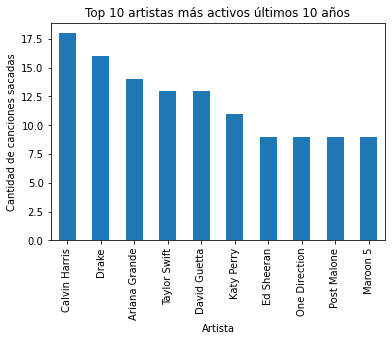

In [68]:
ax = spotify_punto1_df.plot(kind = 'bar', title='Top 10 artistas más activos últimos 10 años')
ax.set_xlabel("Artista")
ax.set_ylabel("Cantidad de canciones sacadas")

# Punto 3

¿Cómo se diferencian las canciones de los géneros de Latin y Folk/Acoustic en relación con
su duración? Halle la diferencia del tiempo promedio de ambos géneros.

In [75]:
# Seleccionamos únicamente los registros con género Folk/Acoustic
spotify_punto2_df_FolkAcoustic = spotify_df[spotify_df['genre'].str.contains('Folk/Acoustic',case=False, na=False)]

In [78]:
# Hallamos el promedio de la duración de las canciones
promedio_genre_FolkAccoustic = spotify_punto2_df_FolkAcoustic['duration_ms'].mean()

In [79]:
# Seleccionamos únicamente los registros con género Latin
spotify_punto2_df_latin = spotify_df[spotify_df['genre'].str.contains('latin',case=False, na=False)]

In [80]:
# Hallamos el promedio de la duración de las canciones
spotify_punto2_df_latin = spotify_punto2_df_latin['duration_ms'].mean()

In [82]:
# Diferencia entre duración promedio de las canciones de los géneros
diff_mean_genre = abs(spotify_punto2_df_latin - promedio_genre_FolkAccoustic)
diff_mean_genre

7491.209375000006

La diferencia entre los 2 género en su duración promedio es de alrededor de 7,491 segundos.

# Punto 4

Halle el top 5 de los géneros del 2019 según la cantidad de canciones. ¿Cómo ha variado la
cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?

In [165]:
spotify_punto4_df = pd.read_excel('/content/Data_Taller_1_Version3.xlsx')
spotify_punto4_df.genre=spotify_punto4_df.genre.str.split(',').tolist()
spotify_punto4_df = spotify_punto4_df.explode('genre')

In [166]:
# Separación de géneros
spotify_punto4_df

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,0.0,2000.0,77.0,0.751,0.834,1.0,-5444.0,0.0,0.0437,0.3000,0.000018,0.3550,0.894,95053.0,pop
1,blink-182,All The Small Things,167066.0,0.0,1999.0,79.0,0.434,0.897,0.0,-4918.0,1.0,0.0488,0.0103,0.000000,0.6120,0.684,148726.0,rock
1,blink-182,All The Small Things,167066.0,0.0,1999.0,79.0,0.434,0.897,0.0,-4918.0,1.0,0.0488,0.0103,0.000000,0.6120,0.684,148726.0,pop
2,Faith Hill,Breathe,250546.0,0.0,1999.0,66.0,0.529,0.496,7.0,-9007.0,1.0,0.0290,0.1730,0.000000,0.2510,0.278,136859.0,pop
2,Faith Hill,Breathe,250546.0,0.0,1999.0,66.0,0.529,0.496,7.0,-9007.0,1.0,0.0290,0.1730,0.000000,0.2510,0.278,136859.0,country
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,Taylor Swift,Cruel Summer,178426.0,0.0,2019.0,78.0,0.552,0.702,9.0,-5707.0,1.0,0.1570,0.1170,0.000021,0.1050,0.564,169994.0,pop
1997,Blanco Brown,The Git Up,200593.0,0.0,2019.0,69.0,0.847,0.678,9.0,-8635.0,1.0,0.1090,0.0669,0.000000,0.2740,0.811,NaN,hip hop
1997,Blanco Brown,The Git Up,200593.0,0.0,2019.0,69.0,0.847,0.678,9.0,-8635.0,1.0,0.1090,0.0669,0.000000,0.2740,0.811,NaN,country
1998,Sam Smith,Dancing With A Stranger (with Normani),171029.0,0.0,2019.0,75.0,0.741,0.520,8.0,-7513.0,1.0,0.0656,0.4500,0.000002,0.2220,0.347,102998.0,pop


In [167]:
# Se remueven espacios que puedan existir antes o después
spotify_punto4_df['genre'] = spotify_punto4_df['genre'].str.strip()

In [168]:
spotify_df_punto3_2000 = spotify_punto4_df[spotify_punto4_df['year']==2000]
spotify_df_punto3_2000.groupby('genre')['song'].count().sort_values(ascending = False)

genre
pop                  57
R&B                  25
hip hop              21
rock                 13
metal                 8
Dance/Electronic      5
Folk/Acoustic         3
latin                 3
World/Traditional     1
Name: song, dtype: int64

In [169]:
spotify_df_punto3_2005 = spotify_punto4_df[spotify_punto4_df['year']==2005]
spotify_df_punto3_2005.groupby('genre')['song'].count().sort_values(ascending = False)

genre
pop                  81
hip hop              51
R&B                  31
rock                 19
Dance/Electronic      5
metal                 5
Folk/Acoustic         4
country               3
latin                 3
World/Traditional     2
easy listening        1
jazz                  1
set()                 1
Name: song, dtype: int64

In [170]:
spotify_df_punto3_2010 = spotify_punto4_df[spotify_punto4_df['year']==2010]
spotify_df_punto3_2010.groupby('genre')['song'].count().sort_values(ascending = False)

genre
pop                  97
hip hop              54
Dance/Electronic     28
R&B                  23
rock                  6
country               4
latin                 2
World/Traditional     1
easy listening        1
Name: song, dtype: int64

In [171]:
spotify_df_punto3_2015 = spotify_punto4_df[spotify_punto4_df['year']==2015]
spotify_df_punto3_2015.groupby('genre')['song'].count().sort_values(ascending = False)

genre
pop                 89
hip hop             33
Dance/Electronic    28
R&B                 21
rock                14
metal                2
classical            1
Name: song, dtype: int64

In [172]:
spotify_df_punto3_2019 = spotify_punto4_df[spotify_punto4_df['year']==2019]
spotify_df_punto3_2019.groupby('genre')['song'].count().sort_values(ascending = False)

genre
pop                 63
hip hop             38
Dance/Electronic    21
R&B                  9
latin                8
metal                2
rock                 2
country              1
set()                1
Name: song, dtype: int64

El top 5 de géneros en el 2019 es:


1.   Pop
2.   Hip Hop
3.   Dance/Electronic
4.   R&B
5.   Latin

A través de los años los géneros Pop, Hip Hop y R&B han permanecido en el top 5 de géneros más escuchados. Los otros géneros que han estado una gran cantidad de veces en el top 5 son el rock y Dance/Electronic



# Punto 5

¿Cómo ha sido la progresión de nuevos artistas? Asuma que un artista nuevo es aquel del cual no se tiene registros pasados y solo es nuevo durante el primer año de aparición.


In [277]:
spotify_newart_df = pd.read_excel('/content/Data_Taller_1_Version3.xlsx')
spotify_newart_df.genre=spotify_newart_df.genre.str.split(',').tolist()
spotify_newart_df = spotify_newart_df.explode('genre')
spotify_newart_df['genre'] = spotify_newart_df['genre'].str.strip()

In [278]:
mask = spotify_df['popularity']>=80
spotify_newart_df = spotify_newart_df[mask]
spotify_newart_df = spotify_newart_df.groupby(['artist','year'])['artist'].count()
spotify_newart_df = spotify_newart_df[:30].copy()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


Text(0, 0.5, 'Cantidad canciones')

<Figure size 2160x2160 with 0 Axes>

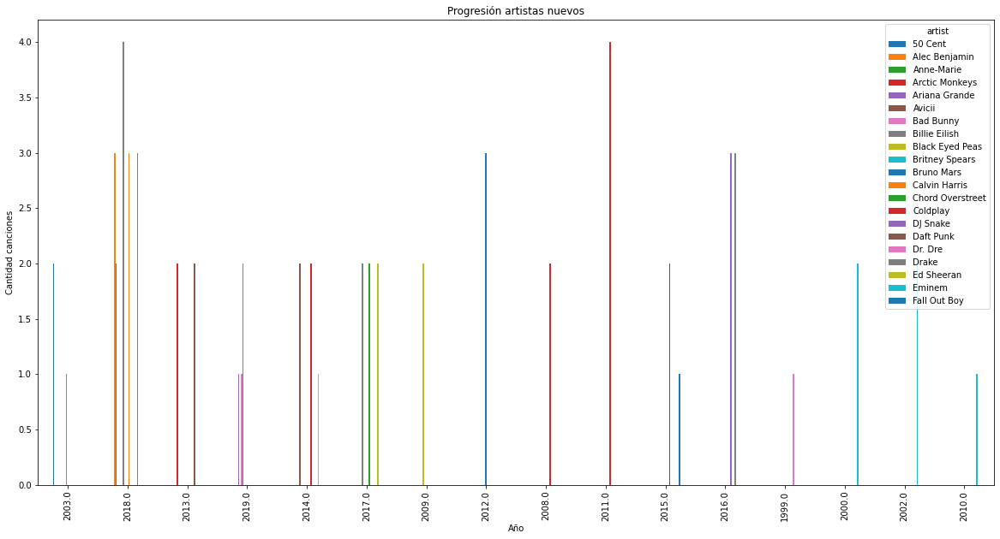

In [287]:
# Se agrupan los artistas por la cantidad de canciones anuales
plt.figure(figsize =(30,30))
ax=(spotify_newart_df.unstack('artist').plot(kind = 'bar', title='Progresión artistas nuevos',figsize=(20, 10)))
ax.set_xlabel('Año')
ax.set_ylabel('Cantidad canciones')

Se puede encontrar que son pocos los artistas que sacan canciones seguidas justo en el año después de sacar su primer sencillo. Muchos pueden sacar solo una canción que los hace populares o un album pero quedan en este o vuelven a sacar sencillos pasado el tiempo

# Punto 6

Grafique la progresión de la popularidad promedio por género y por año. Concluya sobre la gráfica, ej: ¿existen tendencias?

In [224]:
spotify_punto5_df = pd.read_excel('/content/Data_Taller_1_Version3.xlsx')
spotify_punto5_df.genre=spotify_punto5_df.genre.str.split(',').tolist()
spotify_punto5_df = spotify_punto5_df.explode('genre')
spotify_punto5_df['genre'] = spotify_punto5_df['genre'].str.strip()

Text(0, 0.5, 'Año')

<Figure size 2160x2160 with 0 Axes>

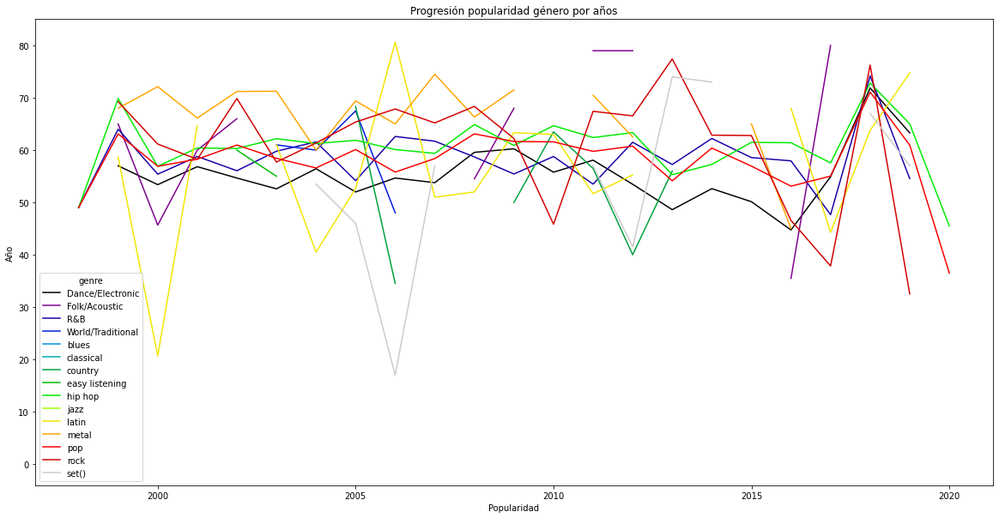

In [232]:
plt.figure(figsize =(30,30))
colormap = plt.cm.nipy_spectral #I suggest to use nipy_spectral, Set1,Paired
ax=(spotify_punto5_df.groupby(['genre','year'])
   ['popularity'].mean().unstack('genre').plot(kind = 'line', title='Progresión popularidad género por años',figsize=(20, 10),color=[colormap(i) for i in np.linspace(0, 1,15)]))
ax.set_xlabel('Popularidad')
ax.set_ylabel('Año')

Se puede ver que algunos géneros no están presentes todos los años como es el caso de los géneros set() o latin que aparecen por intervalos de tiempo. Por otro lado es posible ver que en los últimos años se ha encontrado decaimiento de la popularidad de géneros como pop, rock, hip & hop entre otras mientras que el único género en aumento parece ser la música latina.


# Punto 7
*Compare* los géneros Pop y Rock según sus características de: energy, valence y tempo.
Concluya sobre su análisis.


In [236]:
spotify_punto6_df = pd.read_excel('/content/Data_Taller_1_Version3.xlsx')
spotify_punto6_df.genre=spotify_punto6_df.genre.str.split(',').tolist()
spotify_punto6_df = spotify_punto6_df.explode('genre')
spotify_punto6_df['genre'] = spotify_punto6_df['genre'].str.strip()

In [238]:
spotify_punto6_df_RockPop = spotify_punto6_df[spotify_punto6_df['genre'].str.contains('Rock|Pop',case=False, na=False)]

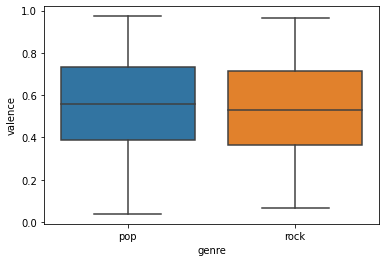

In [240]:
sns.boxplot(x = 'genre', y = 'valence', data = spotify_punto6_df_RockPop)

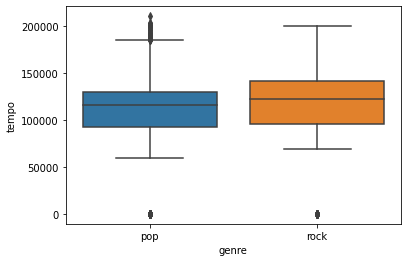

In [241]:
sns.boxplot(x = 'genre', y = 'tempo', data = spotify_punto6_df_RockPop)

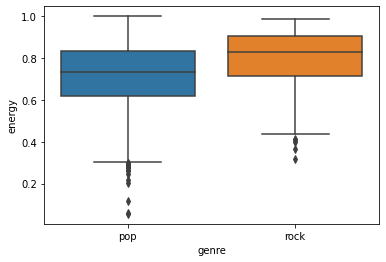

In [239]:
sns.boxplot(x = 'genre', y = 'energy', data = spotify_punto6_df_RockPop)

De las gráficas es posible concluir que tanto el género pop como rock tienen características similares respecto al tiempo en la valencia. Sin embargo, en la energía se tiene que el rock tiene niveles mucho más elevados. Por lo cual se puede asumir que son géneros similares pero mientras uno se puede escuchar para levantar el animo el otro puede escucharse mientras se realizan otras tareas.

# Punto 8

Plantee una pregunta de negocio de su interés, ya sea por tipo de música, artistas u otra
dimensión, mediante la cual se analicen al menos 3 variables del dataset y concluya.

## ¿Cómo se compara la popularidad de las canciones explicitas según el género de las mismas? 

In [242]:
spotify_punto8_df = pd.read_excel('/content/Data_Taller_1_Version3.xlsx')
spotify_punto8_df.genre=spotify_punto8_df.genre.str.split(',').tolist()
spotify_punto8_df = spotify_punto8_df.explode('genre')
spotify_punto8_df['genre'] = spotify_punto8_df['genre'].str.strip()

Text(0, 0.5, 'Popularidad')

<Figure size 2160x2160 with 0 Axes>

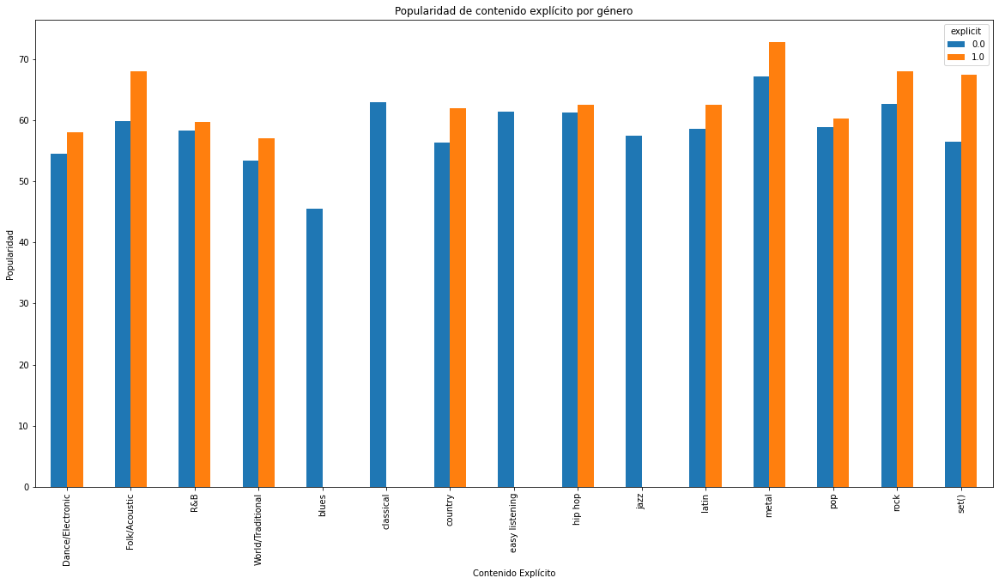

In [244]:
plt.figure(figsize =(30,30))
ax=(spotify_punto8_df.groupby(['genre','explicit'])
   ['popularity'].mean().unstack('explicit').plot(kind = 'bar', title='Popularidad de contenido explícito por género',figsize=(20, 10)))
ax.set_xlabel('Contenido Explícito')
ax.set_ylabel('Popularidad')

Es posible ver que la popularidad de las canciones explicitas tiende a ser mayor cuando existe contenido explícito. Adicionalmente, se puede ver que no hay canciones en el género blues, classical, jazz o easy listening con contenido explícito. Por último, se puede concluir que en los géneros Folk/Accoustic, Metal y Rock existe una mayor afinidad por las canciones con contenido explícito.